In [16]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
from sklearn.impute import SimpleImputer
from tensorflow.keras.regularizers import l1
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report,precision_score, accuracy_score
import seaborn as sns


Data collection and pre-processing

In [2]:
# Loading the csv data to a pandas DataFrame
data = pd.read_csv('/content/water_potability.csv')

In [3]:
#Print 5 rows of the dataset
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [4]:
# number of rows and columns
data.shape

(3276, 10)

In [5]:
# getting some info about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
# checking for missing values
data.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

<Axes: title={'center': 'Finding Null Values Using Heatmap\n'}>

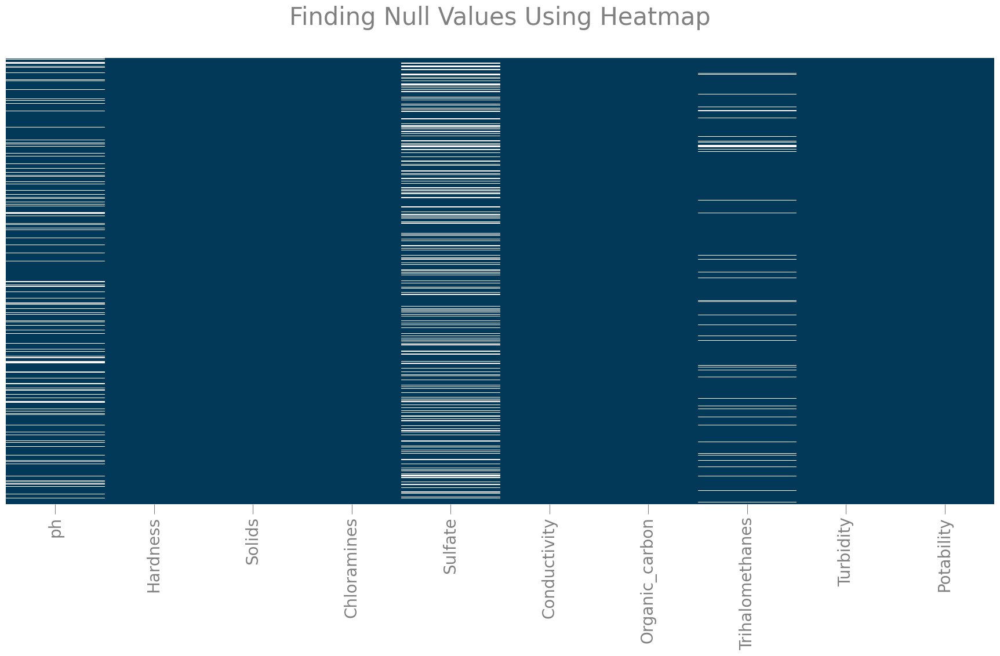

In [7]:
# visualizing null values if it exists
plt.figure(figsize=(22,10))

plt.xticks(size=20,color='grey')
plt.tick_params(size=12,color='grey')

plt.title('Finding Null Values Using Heatmap\n',color='grey',size=30)

sns.heatmap(data.isnull(),
            yticklabels=False,
            cbar=False,
            cmap='PuBu_r',
            )

In [8]:
# statistical mesaure of the data
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [9]:
# checking the distribution of Target Variable
data['Potability'].value_counts()

Potability
0    1998
1    1278
Name: count, dtype: int64

In [10]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [11]:
import pandas_profiling as pp
pp.ProfileReport(data)

<ipython-input-11-8403d1c19783>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Impute missing values
imputer = SimpleImputer(strategy='mean')
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)

In [18]:
# Standardize features
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data_imputed.drop('Potability', axis=1)),
                           columns=data_imputed.drop('Potability', axis=1).columns)
data_scaled['Potability'] = data_imputed['Potability']

In [19]:
# Basic statistical analysis
print("\nDescriptive Statistics:")
print(data_scaled.describe())


Descriptive Statistics:
                 ph      Hardness        Solids   Chloramines       Sulfate  \
count  3.276000e+03  3.276000e+03  3.276000e+03  3.276000e+03  3.276000e+03   
mean  -4.684897e-16  1.024821e-15 -4.012528e-17  5.205441e-16  1.587660e-15   
std    1.000153e+00  1.000153e+00  1.000153e+00  1.000153e+00  1.000153e+00   
min   -4.817747e+00 -4.530454e+00 -2.474344e+00 -4.277288e+00 -5.666636e+00   
25%   -5.464412e-01 -5.937372e-01 -7.239916e-01 -6.285247e-01 -4.616071e-01   
50%   -6.043133e-16  1.819424e-02 -1.238999e-01  5.068209e-03  3.145987e-15   
75%    5.370064e-01  6.174333e-01  6.066532e-01  6.271058e-01  4.596379e-01   
max    4.707802e+00  3.855680e+00  4.472689e+00  3.793631e+00  4.074895e+00   

       Conductivity  Organic_carbon  Trihalomethanes     Turbidity  \
count  3.276000e+03    3.276000e+03     3.276000e+03  3.276000e+03   
mean   1.708035e-16    2.385827e-17     1.691768e-16  5.487403e-16   
std    1.000153e+00    1.000153e+00     1.000153e+00 

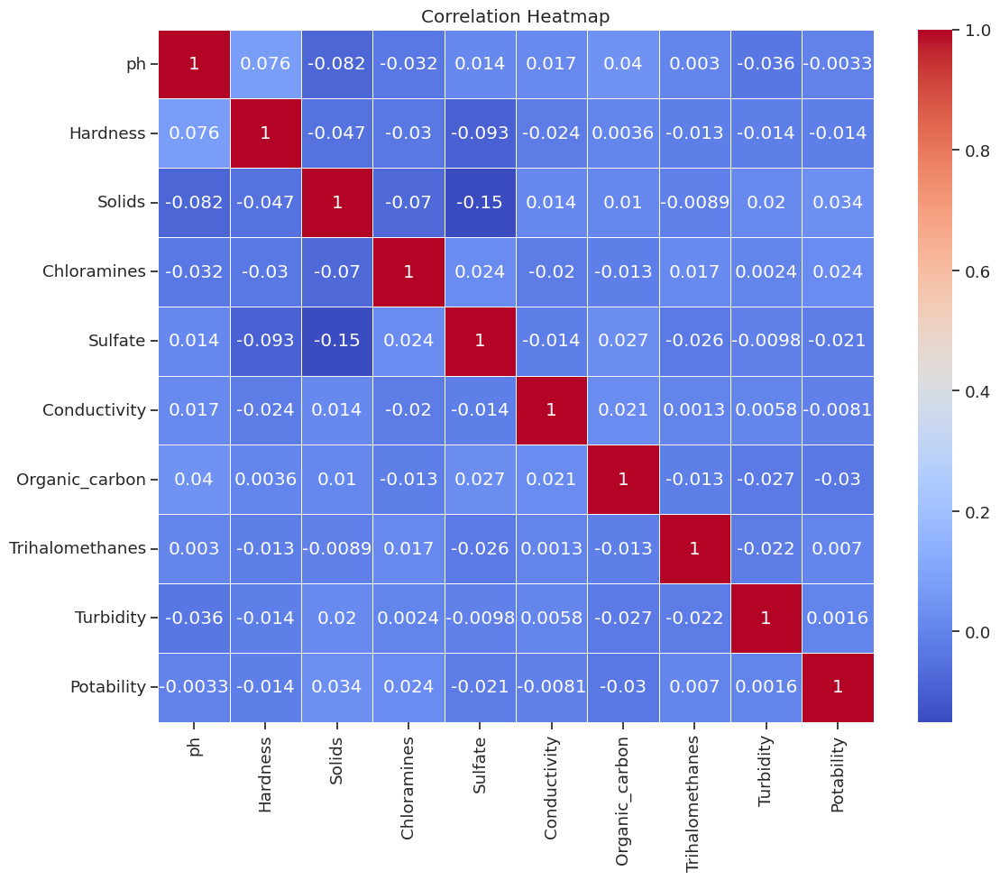

In [20]:
# Correlation analysis
correlation_matrix = data_scaled.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

<Figure size 2000x2000 with 0 Axes>

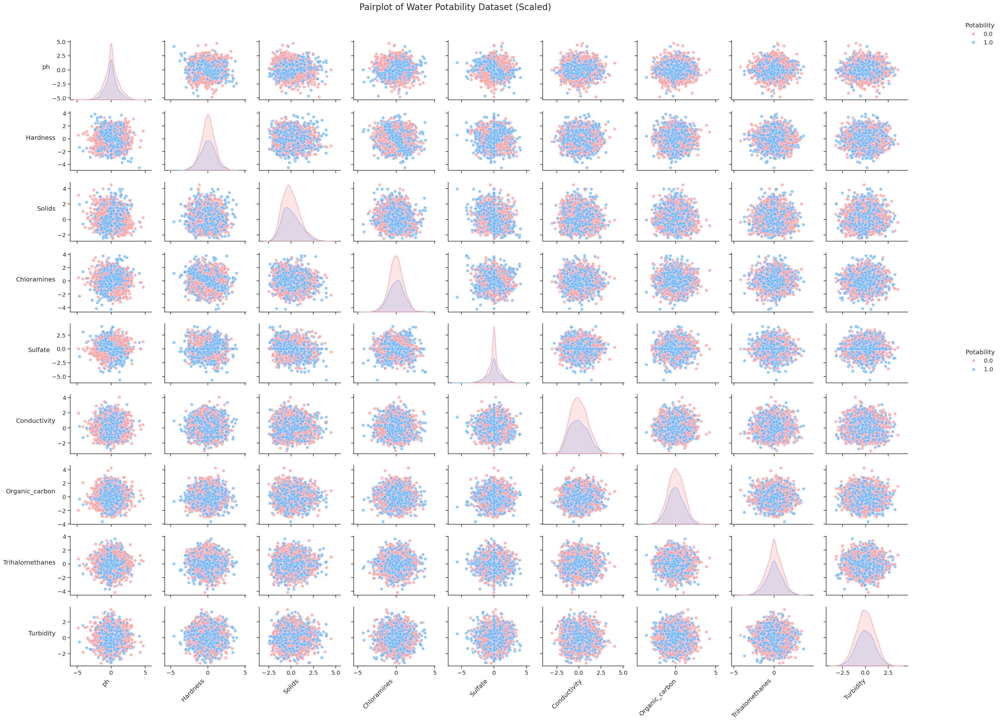

In [21]:
# Create the pairplot
plt.figure(figsize=(20, 20))
sns.set(style="ticks", font_scale=1.2)

pairplot = sns.pairplot(data_scaled,
                        hue="Potability",
                        palette={0: "#FF9999", 1: "#66B2FF"},
                        height=2.5,
                        aspect=1.2,
                        plot_kws=dict(s=50, alpha=0.7, edgecolor="white"),
                        diag_kws=dict(fill=True))

pairplot.fig.suptitle("Pairplot of Water Potability Dataset (Scaled)", y=1.02, fontsize=20)
pairplot.add_legend(title="Potability", bbox_to_anchor=(1.05, 1), loc='upper left')

for ax in pairplot.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), rotation=45, ha='right')
    ax.set_ylabel(ax.get_ylabel(), rotation=0, ha='right')

plt.tight_layout()
plt.show()

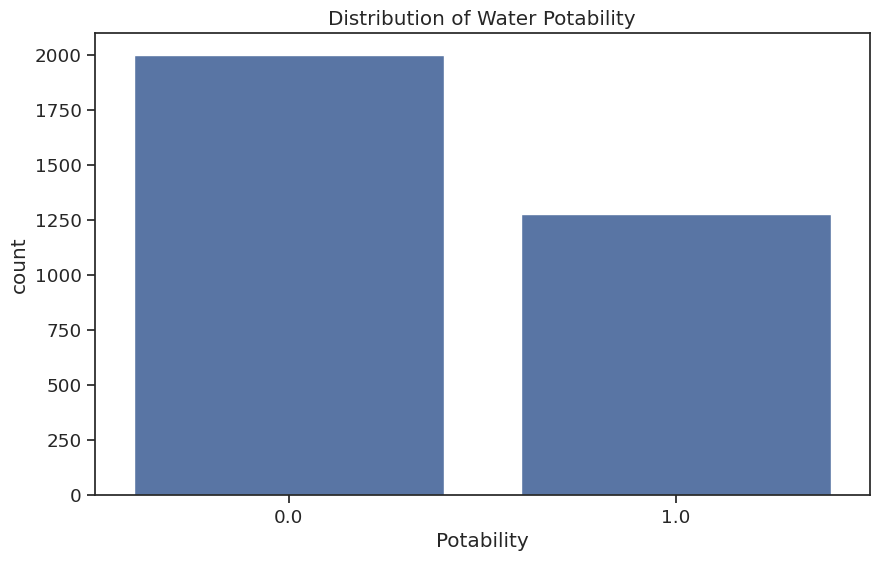

In [22]:
# Distribution of Potability
plt.figure(figsize=(10, 6))
sns.countplot(x='Potability', data=data_scaled)
plt.title('Distribution of Water Potability')
plt.show()

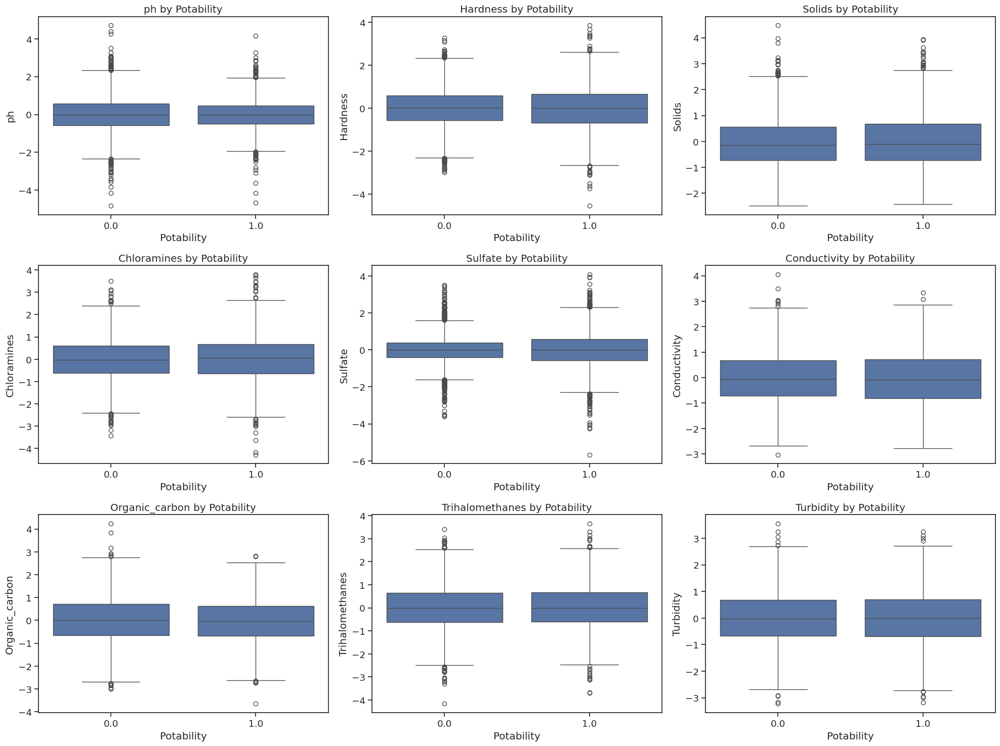

In [23]:
# Box plots for each feature by Potability
plt.figure(figsize=(20, 15))
for i, column in enumerate(data_scaled.drop('Potability', axis=1).columns):
    plt.subplot(3, 3, i+1)
    sns.boxplot(x='Potability', y=column, data=data_scaled)
    plt.title(f'{column} by Potability')
plt.tight_layout()
plt.show()


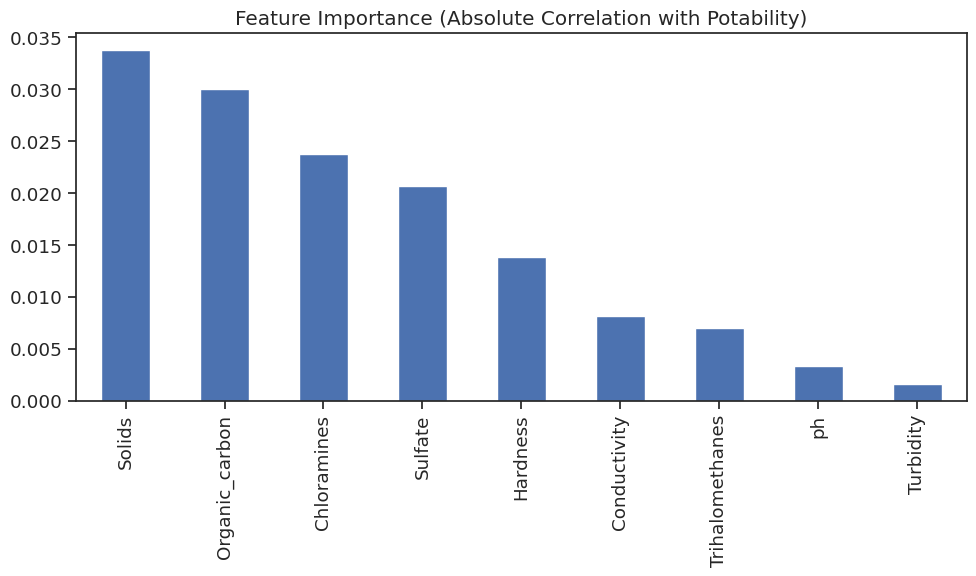


Feature Importance:
Potability         1.000000
Solids             0.033743
Organic_carbon     0.030001
Chloramines        0.023779
Sulfate            0.020619
Hardness           0.013837
Conductivity       0.008128
Trihalomethanes    0.006960
ph                 0.003287
Turbidity          0.001581
Name: Potability, dtype: float64


In [24]:
# Feature importance (using absolute correlation with Potability)
feature_importance = abs(correlation_matrix['Potability']).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
feature_importance.drop('Potability').plot(kind='bar')
plt.title('Feature Importance (Absolute Correlation with Potability)')
plt.tight_layout()
plt.show()

print("\nFeature Importance:")
print(feature_importance)

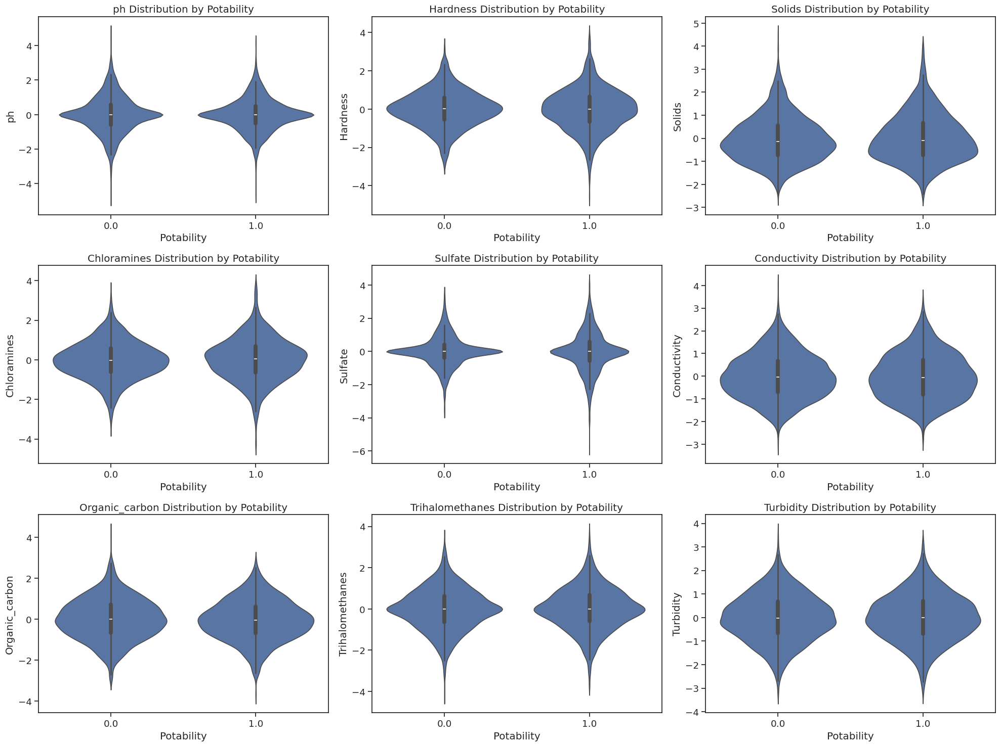

In [25]:
# Violin plots
plt.figure(figsize=(20, 15))
for i, column in enumerate(data_scaled.drop('Potability', axis=1).columns):
    plt.subplot(3, 3, i+1)
    sns.violinplot(x='Potability', y=column, data=data_scaled)
    plt.title(f'{column} Distribution by Potability')
plt.tight_layout()
plt.show()

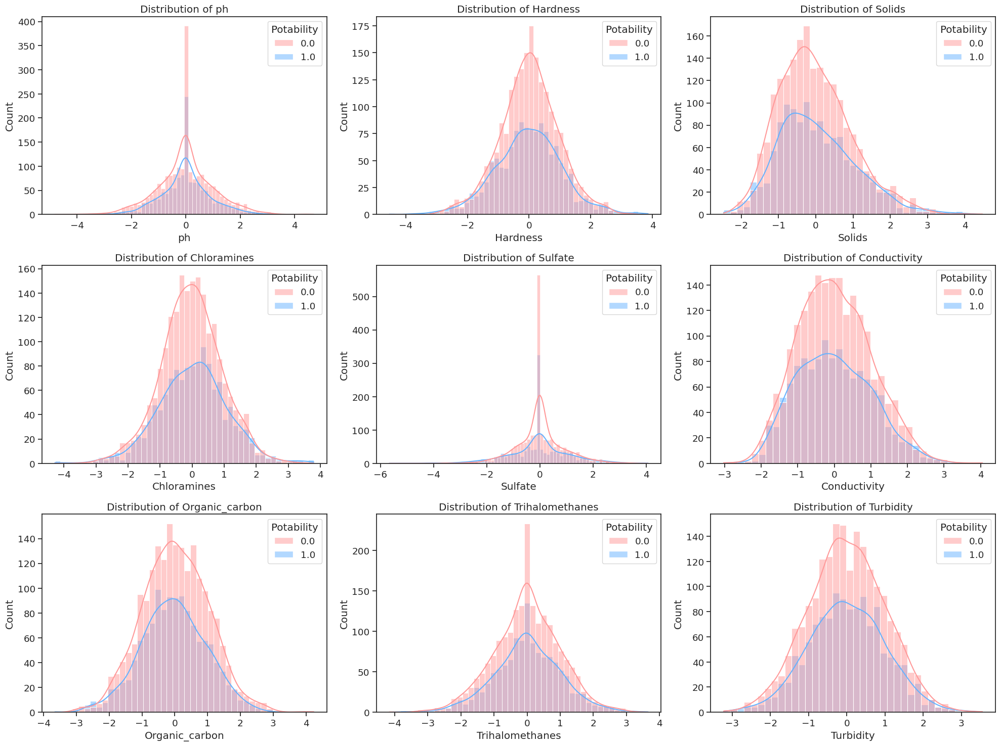

In [26]:
# Histograms
plt.figure(figsize=(20, 15))
for i, column in enumerate(data_scaled.drop('Potability', axis=1).columns):
    plt.subplot(3, 3, i+1)
    sns.histplot(data=data_scaled, x=column, hue='Potability', kde=True, palette={0: "#FF9999", 1: "#66B2FF"})
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

In [27]:
# preprocessed DataFrame
X = data_scaled.drop('Potability', axis=1)
y = data_scaled['Potability']


In [29]:
from sklearn.model_selection import train_test_split

# Data Splitting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# Model Architecture

def create_standard_model():
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

In [33]:
# Create and compile model
model = create_standard_model()
model.compile(optimizer=Adam(),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [34]:
# Model Training
history = model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)

Epoch 1/100
66/66 [==============================] - 3s 9ms/step - loss: 0.6747 - accuracy: 0.6031 - val_loss: 0.6650 - val_accuracy: 0.6164
Epoch 2/100
66/66 [==============================] - 0s 3ms/step - loss: 0.6468 - accuracy: 0.6312 - val_loss: 0.6481 - val_accuracy: 0.6489
Epoch 3/100
66/66 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.6546 - val_loss: 0.6321 - val_accuracy: 0.6584
Epoch 4/100
66/66 [==============================] - 0s 3ms/step - loss: 0.6146 - accuracy: 0.6708 - val_loss: 0.6301 - val_accuracy: 0.6489
Epoch 5/100
66/66 [==============================] - 0s 3ms/step - loss: 0.6031 - accuracy: 0.6784 - val_loss: 0.6193 - val_accuracy: 0.6508
Epoch 6/100
66/66 [==============================] - 0s 3ms/step - loss: 0.5944 - accuracy: 0.6894 - val_loss: 0.6110 - val_accuracy: 0.6813
Epoch 7/100
66/66 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.6894 - val_loss: 0.6135 - val_accuracy: 0.6603
Epoch 8/100
6

In [35]:
# Model Evaluation
loss,accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Standard Model - Test Loss: {loss:.4f}, Test Accuracy:{accuracy:.4f}")

Standard Model - Test Loss: 0.8073, Test Accuracy:0.6280


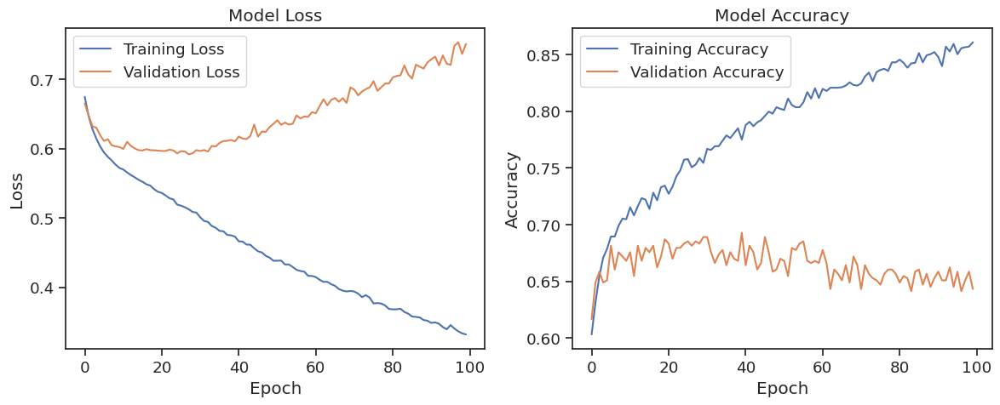

In [36]:
# Plotting training history
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [37]:
# Model Variation 1: Deeper Network

def create_deeper_model():
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        BatchNormalization(),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dense(32, activation='relu'),
        BatchNormalization(),
        Dense(16, activation='relu'),
        BatchNormalization(),
        Dense(1, activation='sigmoid')
    ])
    return model

deeper_model = create_deeper_model()
deeper_model.compile(optimizer=Adam(learning_rate=0.001),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

deeper_history = deeper_model.fit(X_train, y_train,
                                  validation_split=0.2,
                                  epochs=150,
                                  batch_size=32,
                                  callbacks=[EarlyStopping(patience=15, restore_best_weights=True)],
                                  verbose=1)

deeper_loss, deeper_accuracy = deeper_model.evaluate(X_test, y_test, verbose=0)
print(f"Deeper Model - Test Loss: {deeper_loss:.4f}, Test Accuracy: {deeper_accuracy:.4f}")


Epoch 1/150
66/66 [==============================] - 5s 9ms/step - loss: 0.7263 - accuracy: 0.5534 - val_loss: 0.6614 - val_accuracy: 0.6107
Epoch 2/150
66/66 [==============================] - 0s 4ms/step - loss: 0.6207 - accuracy: 0.6522 - val_loss: 0.6462 - val_accuracy: 0.6317
Epoch 3/150
66/66 [==============================] - 0s 4ms/step - loss: 0.5959 - accuracy: 0.6851 - val_loss: 0.6408 - val_accuracy: 0.6221
Epoch 4/150
66/66 [==============================] - 0s 5ms/step - loss: 0.5840 - accuracy: 0.6947 - val_loss: 0.6172 - val_accuracy: 0.6679
Epoch 5/150
66/66 [==============================] - 0s 4ms/step - loss: 0.5624 - accuracy: 0.7156 - val_loss: 0.6067 - val_accuracy: 0.6889
Epoch 6/150
66/66 [==============================] - 0s 4ms/step - loss: 0.5591 - accuracy: 0.7123 - val_loss: 0.6141 - val_accuracy: 0.6622
Epoch 7/150
66/66 [==============================] - 0s 5ms/step - loss: 0.5451 - accuracy: 0.7147 - val_loss: 0.6188 - val_accuracy: 0.6698
Epoch 8/150
6

In [38]:
def create_regularized_model():
    model = Sequential([
        Dense(64, activation='relu', kernel_regularizer=l2(0.01), input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
        Dense(16, activation='relu', kernel_regularizer=l2(0.01)),
        Dense(1, activation='sigmoid')
    ])
    return model

regularized_model = create_regularized_model()
regularized_model.compile(optimizer=Adam(learning_rate=0.001),
                          loss='binary_crossentropy',
                          metrics=['accuracy'])

regularized_history = regularized_model.fit(X_train, y_train,
                                            validation_split=0.2,
                                            epochs=150,
                                            batch_size=32,
                                            callbacks=[EarlyStopping(patience=15, restore_best_weights=True)],
                                            verbose=1)

regularized_loss, regularized_accuracy = regularized_model.evaluate(X_test, y_test, verbose=0)
print(f"Regularized Model - Test Loss: {regularized_loss:.4f}, Test Accuracy: {regularized_accuracy:.4f}")

Epoch 1/150
66/66 [==============================] - 2s 6ms/step - loss: 1.3414 - accuracy: 0.5816 - val_loss: 1.1903 - val_accuracy: 0.6050
Epoch 2/150
66/66 [==============================] - 0s 3ms/step - loss: 1.0759 - accuracy: 0.6054 - val_loss: 0.9862 - val_accuracy: 0.6050
Epoch 3/150
66/66 [==============================] - 0s 3ms/step - loss: 0.9109 - accuracy: 0.6054 - val_loss: 0.8604 - val_accuracy: 0.6050
Epoch 4/150
66/66 [==============================] - 0s 3ms/step - loss: 0.8117 - accuracy: 0.6059 - val_loss: 0.7846 - val_accuracy: 0.6050
Epoch 5/150
66/66 [==============================] - 0s 2ms/step - loss: 0.7526 - accuracy: 0.6102 - val_loss: 0.7394 - val_accuracy: 0.6050
Epoch 6/150
66/66 [==============================] - 0s 3ms/step - loss: 0.7169 - accuracy: 0.6116 - val_loss: 0.7095 - val_accuracy: 0.6164
Epoch 7/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.6298 - val_loss: 0.6897 - val_accuracy: 0.6489
Epoch 8/150
6

Epoch 1/150
66/66 [==============================] - 1s 6ms/step - loss: 0.6949 - accuracy: 0.5582 - val_loss: 0.6707 - val_accuracy: 0.6031
Epoch 2/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6867 - accuracy: 0.5706 - val_loss: 0.6709 - val_accuracy: 0.6164
Epoch 3/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6710 - accuracy: 0.5959 - val_loss: 0.6662 - val_accuracy: 0.6107
Epoch 4/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6685 - accuracy: 0.6059 - val_loss: 0.6615 - val_accuracy: 0.6183
Epoch 5/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.6078 - val_loss: 0.6563 - val_accuracy: 0.6317
Epoch 6/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.6188 - val_loss: 0.6505 - val_accuracy: 0.6374
Epoch 7/150
66/66 [==============================] - 0s 3ms/step - loss: 0.6518 - accuracy: 0.6341 - val_loss: 0.6437 - val_accuracy: 0.6489
Epoch 8/150
6

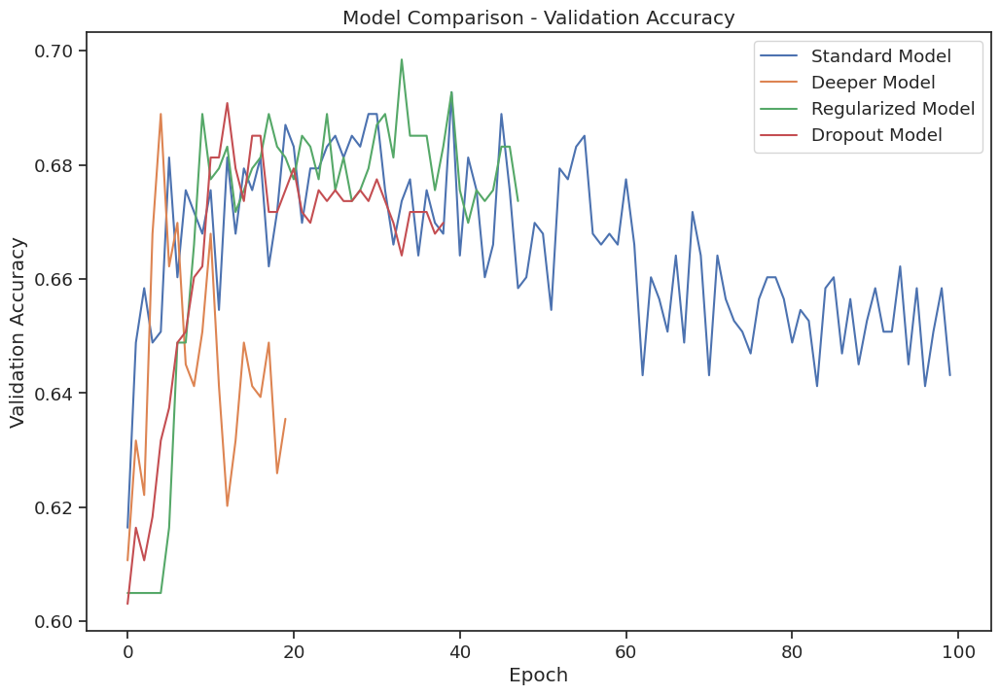

In [40]:
# Model Variation 3: With Dropout

def create_dropout_model():
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

dropout_model = create_dropout_model()
dropout_model.compile(optimizer=Adam(learning_rate=0.001),
                      loss='binary_crossentropy',
                      metrics=['accuracy'])

dropout_history = dropout_model.fit(X_train, y_train,
                                    validation_split=0.2,
                                    epochs=150,
                                    batch_size=32,
                                    callbacks=[EarlyStopping(patience=15, restore_best_weights=True)],
                                    verbose=1)

dropout_loss, dropout_accuracy = dropout_model.evaluate(X_test, y_test, verbose=0)
print(f"Dropout Model - Test Loss: {dropout_loss:.4f}, Test Accuracy: {dropout_accuracy:.4f}")

# Comparing all models
models = {
    'Standard': history,
    'Deeper': deeper_history,
    'Regularized': regularized_history,
    'Dropout': dropout_history
}

plt.figure(figsize=(12, 8))
for name, hist in models.items():
    plt.plot(hist.history['val_accuracy'], label=f'{name} Model')
plt.title('Model Comparison - Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.show()

In [45]:
# Model Evaluation
y_pred = (dropout_model.predict(X_test) > 0.5).astype(int)
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

21/21 [==============================] - 0s 8ms/step
Confusion Matrix:
[[387  25]
 [ 91 153]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.81      0.94      0.87       412
         1.0       0.86      0.63      0.73       244

    accuracy                           0.82       656
   macro avg       0.83      0.78      0.80       656
weighted avg       0.83      0.82      0.82       656



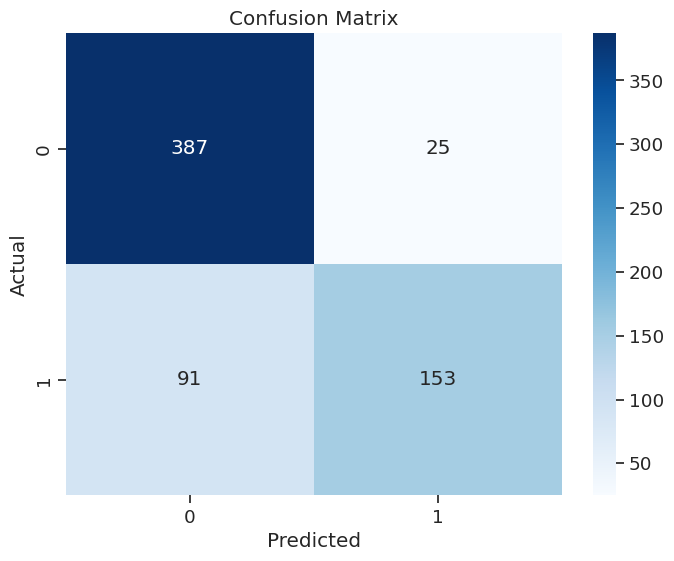

In [46]:
# Visualize confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

21/21 [==============================] - 0s 2ms/step
           feature  importance
0               ph    0.042378
4          Sulfate    0.040854
2           Solids    0.002287
3      Chloramines   -0.004268
1         Hardness   -0.007927
5     Conductivity   -0.008384
7  Trihalomethanes   -0.011280
8        Turbidity   -0.014024
6   Organic_carbon   -0.014482


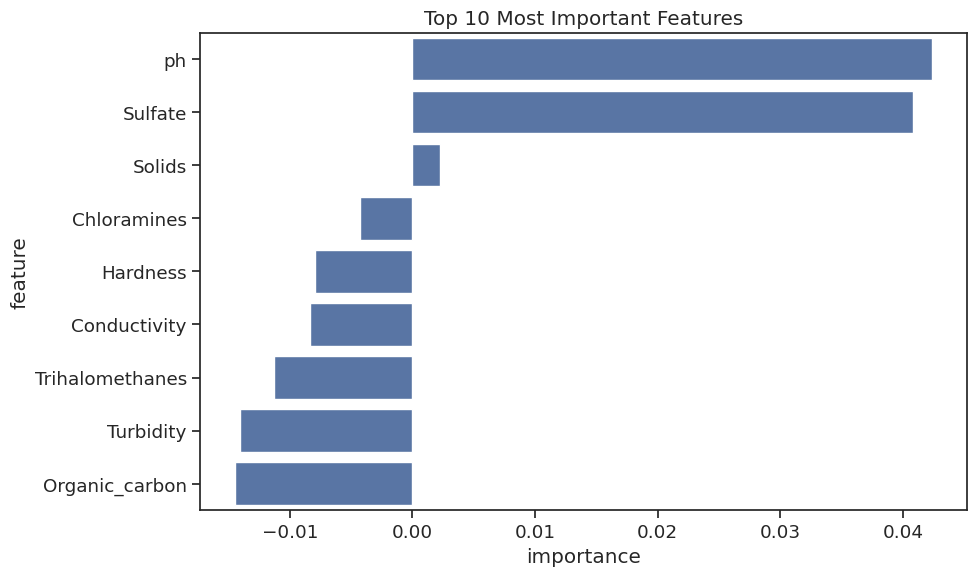

In [43]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

class KerasClassifierWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        return self

    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int)

    def score(self, X, y):
        return accuracy_score(y, self.predict(X))

def get_feature_importance(model, X, y, feature_names): # Add feature_names as an argument
    wrapped_model = KerasClassifierWrapper(model)
    perm_importance = permutation_importance(wrapped_model, X, y, n_repeats=10, random_state=42)
    feature_importance = pd.DataFrame({
        'feature': feature_names,  # Use the provided feature names
        'importance': perm_importance.importances_mean
    }).sort_values('importance', ascending=False)
    return feature_importance

# Assuming X_test is still a DataFrame when you call this function
feature_importance = get_feature_importance(dropout_model, X_test_np, y_test_np, X_test.columns) # Pass column names from X_test
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(10))
plt.title('Top 10 Most Important Features')
plt.tight_layout()
plt.show()

In [47]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 7.1 MB/s eta 0:00:00


In [50]:
# Threshold Optimization
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, dropout_model.predict(X_test))
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal threshold: {optimal_threshold}")

21/21 [==============================] - 0s 6ms/step
Optimal threshold: 0.3507460951805115


In [52]:
import pickle

# Save the model
with open('water_quality_model.pkl', 'wb') as file:
    pickle.dump(dropout_model, file)

In [54]:
# Documentation and Reporting
print("Model Summary:")
dropout_model.summary()

print("\nBest Model Performance:")
print(f"Accuracy: {dropout_accuracy:.4f}")
print(f"Loss: {dropout_loss:.4f}")

print("\nTop 5 Important Features:")
print(feature_importance.head())

print("\nInsights and Recommendations:")
print("1. The model achieves an accuracy of {:.2f}% on the test set.".format(dropout_accuracy * 100))
print("2. The most important feature for predicting water potability is {}.".format(feature_importance.iloc[0]['feature']))
print("3. I need to consider collecting more data or using advanced techniques like ensemble methods for potential improvement.")
print("4. Regular model retraining may be necessary to maintain performance as new data becomes available.")

Model Summary:
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 64)                640       
                                                                 
 dropout_3 (Dropout)         (None, 64)                0         
                                                                 
 dense_17 (Dense)            (None, 32)                2080      
                                                                 
 dropout_4 (Dropout)         (None, 32)                0         
                                                                 
 dense_18 (Dense)            (None, 16)                528       
                                                                 
 dropout_5 (Dropout)         (None, 16)                0         
                                                                 
 dense_19 (Dense)            (None, 1) 